In [11]:
import os

os.chdir("/home/tales/dev/master/mdc_analysis/")
print("working dir", os.getcwd())

import pandas as pd
from pyproj import Proj, transform
import geopy.distance as gp

import matplotlib.pyplot as plt
from src.dao import csv_dao, dbdao
from src.plot import plot
from src.utils import geo
from src.utils.others import clusters
from src.utils.color_utils import palette
import copy

from bokeh.io import output_notebook, show
output_notebook()

pd.set_option('display.float_format', lambda x: '%.4f' % x)

import warnings
warnings.filterwarnings('ignore')

working dir /home/tales/dev/master/mdc_analysis


Loading BokehJS ...

## POIs summary 

In [2]:
def valid_amenities(pois):
    return pois[pois["amenity"].isna() == False]

def convert_3857_4326(lat, lon):
    inProj  = Proj("+init=EPSG:3857")
    outProj = Proj("+init=EPSG:4326")
    return transform(inProj,outProj,lat,lon)

def convert_4326_3857(lat, lon):
    inProj  = Proj("+init=EPSG:4326")
    outProj = Proj("+init=EPSG:3857")
    return transform(inProj,outProj,lat,lon)

def load_user_stop_regions_centroids(user_id):
    centroids = []
    stop_regions = csv_dao.load_user_stop_regions(user_id)
    for sr in stop_regions:
        centroids.append(geo.cluster_centroid(sr))
        
    return pd.DataFrame(centroids)

def pois_inside_bounding_box(pois, box):
    pois_inside_box = pois[(pois["lat_4326"] >= box["latitude"].min()) & 
                           (pois["lat_4326"] <= box["latitude"].max()) &
                           (pois["lon_4326"] >= box["longitude"].min()) &
                           (pois["lon_4326"] <= box["longitude"].max())]
    
    print("{} pois out of {}".format(len(pois_inside_box), len(pois)))
    return pois_inside_box

In [3]:
pois = csv_dao.load_hot_osm_pois()
valid_pois = valid_amenities(pois)

valid_pois["lon_4326"] = round(valid_pois.apply(lambda row : convert_3857_4326(lat=row["latitude"], lon=row["longitude"])[0], axis=1), 5)
valid_pois["lat_4326"] = round(valid_pois.apply(lambda row : convert_3857_4326(lat=row["latitude"], lon=row["longitude"])[1], axis=1), 5)

valid_pois.sample(6)

/home/tales/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/home/tales/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,osm_id,amenity,name,place,latitude,longitude,SRID,lon_4326,lat_4326
247668,2579593586,toilets,NaN,NaN,949128.4000,6005602.1400,900913,8.5262,47.3878
88265,409815801,fast_food,McDonald's,NaN,846057.3500,5953302.2200,900913,7.6003,47.0687
21166,4450804718,atm,NaN,NaN,813462.4700,5816213.0800,900913,7.3075,46.2234
260298,664398860,police,Stadtpolizei Wetzikon,NaN,979932.5900,5995868.7000,900913,8.8029,47.3286
166213,1258075096,bbq,NaN,NaN,881072.7700,6008390.6500,900913,7.9148,47.4047
265071,292636537,atm,NaN,NaN,971100.7900,6024032.6000,900913,8.7235,47.4998


In [4]:
print()
print("Around {0:.2f}% of Hot OSM points have a valid amenity".format(pois["amenity"].count() / len(pois)))
print("{} valid amenities out of {} registered points".format(pois["amenity"].count(), len(pois)))


Around 0.18% of Hot OSM points have a valid amenity
55267 valid amenities out of 314876 registered points


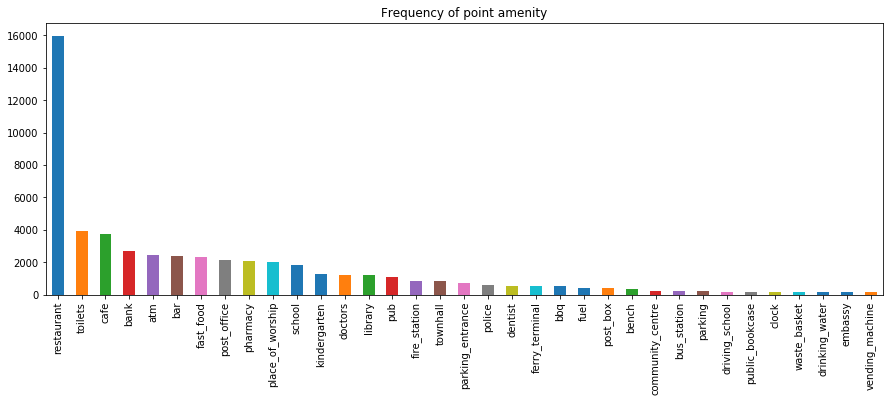

In [5]:
f, ax = plt.subplots(figsize=(15,5))
pois["amenity"].value_counts().head(35).plot.bar(title="Frequency of point amenity")

## POIs distribution

In [6]:
p = None

n_sample = 10000

sample_pois = valid_pois.sample(n_sample)

for amenity in sample_pois["amenity"].drop_duplicates():
    amenity_data = sample_pois[sample_pois["amenity"] == amenity]
    p = plot.plot_poi(amenity_data, title="", figure=p, width=400, height=300, color="navy")
    
show(p)
print("Sample size: {}".format(n_sample))
print("{}% of valid amenities".format(round(float(n_sample) / len(valid_pois), 2)))

Sample size: 10000
0.18% of valid amenities


## Clustering

In [7]:
p = None

sample_pois["cluster"] = clusters(sample_pois, k=4, columns=["lat_4326", "lon_4326"])
colors = palette()

color_n = 0
for cluster in sample_pois["cluster"].drop_duplicates():
    color_n += 1
    cluster_data = sample_pois[sample_pois["cluster"] == cluster]
    
    p = plot.plot_poi(cluster_data, title="", figure=p, width=400, height=300, color=colors[color_n])
    
show(p)
print("Sample size: {}".format(n_sample))
print("{}% of valid amenities".format(round(float(n_sample) / len(valid_pois), 2)))

Sample size: 10000
0.18% of valid amenities


## A User Stop Centroids

In [8]:
user = "6189"
centroids = load_user_stop_regions_centroids(user)
len(centroids)

574

In [9]:
sr = plot.plot_stop_regions(csv_dao.load_user_stop_regions(user), 
                           title="Stop Region Centroids for user {}".format(user),
                           width=600, height=400)
show(sr)

## Using only closer POIs

In [12]:
box = geo.user_bounding_box(user, expand=0.05)
bounding_box_pois = pois_inside_bounding_box(valid_pois, box)

bounding_box_pois.head()

3402 pois out of 55267


,osm_id,amenity,name,place,latitude,longitude,SRID,lon_4326,lat_4326
12705,2408907710,post_office,Onnion,NaN,721193.5300,5807764.8600,900913,6.4786,46.1708
12706,3313743232,library,Lire c'est mes Onnion,NaN,721594.2900,5808052.8100,900913,6.4822,46.1726
13226,5809311266,restaurant,Café de la Chevrerie,NaN,731621.5000,5814467.0100,900913,6.5723,46.2125
13272,1946736662,restaurant,Encrenaz,NaN,738456.3900,5808099.2800,900913,6.6337,46.1729
13379,4683804324,library,Bibliothèque Municipale,NaN,742233.9700,5810546.7600,900913,6.6676,46.1881


In [13]:
bb_p = plot.plot_poi(bounding_box_pois, figure=sr, color="navy",
                 title="Stop Region Centroids and POIs for user {}".format(user))
show(bb_p)

## Aplying Bounding Box To Clusters

In [19]:
cluster_data["longitude"].describe()

count   1374.0000
mean       9.0058
std        0.4807
min        7.8677
25%        8.7129
50%        8.9572
75%        9.2840
max       10.1955
Name: longitude, dtype: float64

In [21]:
cluster_data["lon_4326"].describe()

count   1374.0000
mean       9.0058
std        0.4807
min        7.8677
25%        8.7129
50%        8.9572
75%        9.2840
max       10.1955
Name: lon_4326, dtype: float64

In [20]:
csv_dao.load_user_stop_regions(user)[0]["longitude"].describe()

count   17.0000
mean     6.8665
std      0.0002
min      6.8663
25%      6.8664
50%      6.8664
75%      6.8665
max      6.8670
Name: longitude, dtype: float64

In [25]:
bb_cluster_p = plot.plot_stop_regions(csv_dao.load_user_stop_regions(user), 
                           title="Stop Region Centroids for user {}".format(user),
                           width=600, height=400)

centroids["cluster"] = clusters(centroids, k=4, columns=["latitude", "longitude"])
colors = palette()

color_n = 0
for cluster in centroids["cluster"].drop_duplicates():
    color_n += 1
    cluster = centroids[centroids["cluster"] == cluster] 
    pois_data = geo.grab_pois_by_stop_region_bounding_box(valid_pois, cluster)
    
    pois_data["latitude"] = pois_data["lat_4326"]
    pois_data["longitude"] = pois_data["lon_4326"]
    
    bb_cluster_p = plot.plot_user_loc(pois_data, title="", p=bb_cluster_p, width=600, height=400, color=colors[color_n])
    
show(bb_cluster_p)

560 pois out of 55267
1117 pois out of 55267
83 pois out of 55267
206 pois out of 55267


## Expand Bounding Box 0.15

In [26]:
bb_cluster_expanded_p = plot.plot_stop_regions(csv_dao.load_user_stop_regions(user), 
                           title="Stop Region Centroids for user {}".format(user),
                           width=600, height=400)

centroids["cluster"] = clusters(centroids, k=4, columns=["latitude", "longitude"])
colors = palette()

color_n = 0
for cluster in centroids["cluster"].drop_duplicates():
    color_n += 1
    
    cluster = centroids[centroids["cluster"] == cluster] 
    pois_data = geo.grab_pois_by_stop_region_bounding_box(valid_pois, cluster)
    
    pois_data["latitude"] = pois_data["lat_4326"]
    pois_data["longitude"] = pois_data["lon_4326"]
    
    bb_cluster_expanded_p = plot.plot_user_loc(pois_data, title="", p=bb_cluster_expanded_p, width=600, height=400, color=colors[color_n])
    
show(bb_cluster_expanded_p)

560 pois out of 55267
1117 pois out of 55267
83 pois out of 55267
206 pois out of 55267


## Expand fixed value 0.004

In [38]:
def distance(lat1, lon1, lat2, lon2):
    coords1 = (lat1, lon1)
    coords2 = (lat2, lon2)
    distance = gp.distance(coords1, coords2).m #utiliza o modelo WGS-84
    return distance

print(centroids.iloc[0])

distance(46.4537, 6.8665, 46.4537 + 0.004, 6.8665 + 0.004)

latitude    46.4537
longitude    6.8665
cluster      3.0000
Name: 0, dtype: float64


540.498461579129

In [35]:
bb_cluster_expanded_p = plot.plot_stop_regions(csv_dao.load_user_stop_regions(user), 
                           title="Stop Region Centroids for user {}".format(user),
                           width=600, height=400)

centroids["cluster"] = clusters(centroids, k=4, columns=["latitude", "longitude"])
colors = palette()

color_n = 0
for cluster in centroids["cluster"].drop_duplicates():
    color_n += 1
    
    cluster = centroids[centroids["cluster"] == cluster] 
    pois_data = geo.grab_pois_by_stop_region_bounding_box_expand_fixed(valid_pois, cluster, 0.003)
    
    pois_data["latitude"] = pois_data["lat_4326"]
    pois_data["longitude"] = pois_data["lon_4326"]
    
    bb_cluster_expanded_p = plot.plot_user_loc(pois_data, title="", p=bb_cluster_expanded_p, width=600, height=400, color=colors[color_n])
    
show(bb_cluster_expanded_p)

609 pois out of 55267
1130 pois out of 55267
85 pois out of 55267
229 pois out of 55267
